In [ ]:
import os
import time
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
from scipy.sparse import csr_matrix
import logging
import matplotlib.pyplot as plt
import matplotlib.axes as axes
import scipy
import scipy.stats
from sklearn.preprocessing import scale

BILLING_PROJECT_ID = os.environ['WORKSPACE_NAMESPACE']
WORKSPACE = os.environ['WORKSPACE_NAME']
bucket = os.environ['WORKSPACE_BUCKET']

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')



2024-07-17 17:49:30.150286: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-17 17:49:59.647954: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2024-07-17 17:49:59.650009: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such 

scanpy==1.10.1 anndata==0.10.7 umap==0.5.6 numpy==1.24.4 scipy==1.13.0 pandas==2.0.3 scikit-learn==1.3.0 statsmodels==0.14.0 pynndescent==0.5.12


## 

In [ ]:
!gsutil cp $bucket/cellranger_output_directory/bladder/harmony/MIBC_harmony_metadata.csv .
BLAD_info = pd.read_csv("MIBC_harmony_metadata.csv") 
BLAD_info

Copying gs://fc-18b922c4-ddb9-4e4e-afea-30b0f50cceac/cellranger_output_directory/bladder/harmony/MIBC_harmony_metadata.csv...
/ [1 files][  1.4 KiB/  1.4 KiB]                                                
Operation completed over 1 objects/1.4 KiB.                                      


,CORIS ID,CaTissue Specimen ID,Sample ID,Response,Age at diagnose,T stage,N state,Type NAC,Cycles,Gender,Smoking,batch,Sample
0,306850,BLAD1002,BLAD1002,T2 non-responders,60,T4a,N0,Cis/gem,6,F,yes,14-Nov-22,NR1
1,378857,BLAD1029,BLAD1029,T2 non-responders,66,T3a,N2,ddMVAC,4,M,not assesses,"Novemebr 14, 2022",NR2
2,701632,BLAD1077_GEX,BLAD1077_gex_ccg,T2 non-responders,63,T3b,N0,Cis/gem,4,M,former,"November, 2021",NR3
3,701632,CCG1138b_BLAD1077,BLAD1077_MO_CCG,T2 non-responders,63,T3b,N0,Cis/gem,4,M,former,"September, 2022",NR4
4,682231,BLAD1078,BLAD1078,T0 compelete response,65,T0,N0,Cis/gem,4,M,former,14-Nov-22,R1
5,682231,BLAD1078_GEX,BLAD1078_gex_ccg,T0 compelete response,65,T0,N0,Cis/gem,4,M,former,"November, 2021",R2
6,724627,BLAD_1106,BLAD1106,T2 non-responders,66,T4b,N0,Cis/gem,4,F,never,9-Nov-22,NR5
7,560673,BLAD_1118,BLAD1118,T2 non-responders,44,T3b,N1,Cis/gem,4,M,never,8-Dec-22,NR6
8,52404539,BLAD_1120,BLAD1120,T2 non-responders,63,T3a,N0,Cis/gem,4,F,current,15-Nov-22,NR7
9,843980,BLAD_1127,BLAD1127,T2 non-responders,77,T3a,N1,Cis/gem,3,F,former,9-Nov-22,NR8


In [3]:
BLAD_info = BLAD_info.sort_values(['Sample'])
BLAD_info = BLAD_info.reset_index(drop=True)
BLAD_info

,CORIS ID,CaTissue Specimen ID,Sample ID,Response,Age at diagnose,T stage,N state,Type NAC,Cycles,Gender,Smoking,batch,Sample
0,306850,BLAD1002,BLAD1002,T2 non-responders,60,T4a,N0,Cis/gem,6,F,yes,14-Nov-22,NR1
1,378857,BLAD1029,BLAD1029,T2 non-responders,66,T3a,N2,ddMVAC,4,M,not assesses,"Novemebr 14, 2022",NR2
2,701632,BLAD1077_GEX,BLAD1077_gex_ccg,T2 non-responders,63,T3b,N0,Cis/gem,4,M,former,"November, 2021",NR3
3,701632,CCG1138b_BLAD1077,BLAD1077_MO_CCG,T2 non-responders,63,T3b,N0,Cis/gem,4,M,former,"September, 2022",NR4
4,724627,BLAD_1106,BLAD1106,T2 non-responders,66,T4b,N0,Cis/gem,4,F,never,9-Nov-22,NR5
5,560673,BLAD_1118,BLAD1118,T2 non-responders,44,T3b,N1,Cis/gem,4,M,never,8-Dec-22,NR6
6,52404539,BLAD_1120,BLAD1120,T2 non-responders,63,T3a,N0,Cis/gem,4,F,current,15-Nov-22,NR7
7,843980,BLAD_1127,BLAD1127,T2 non-responders,77,T3a,N1,Cis/gem,3,F,former,9-Nov-22,NR8
8,682231,BLAD1078,BLAD1078,T0 compelete response,65,T0,N0,Cis/gem,4,M,former,14-Nov-22,R1
9,682231,BLAD1078_GEX,BLAD1078_gex_ccg,T0 compelete response,65,T0,N0,Cis/gem,4,M,former,"November, 2021",R2


In [ ]:
adata = [None]*BLAD_info.shape[0]
mtxs = BLAD_info['Sample ID'].tolist()
meta_info = BLAD_info.to_dict()

for index in range(0,len(mtxs)):
    
    print("Reading in file: {}".format(mtxs[index]))
    
    ## read in 10x matrix files
    !gsutil cp $bucket/cellranger_output_directory/bladder/{mtxs[index]}/doublet_removed.h5ad .
    adata[index] = sc.read_h5ad('/home/jupyter/carvalho_bladder_cisplatin/edit/doublet_removed.h5ad')
    adata[index].var_names_make_unique()
    
    adata[index].var['mt'] = adata[index].var_names.str.startswith('MT-')
    adata[index].var['ribo'] = adata[index].var_names.str.startswith(('RPS',"RPL"))
    sc.pp.calculate_qc_metrics(adata[index], qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)
    sc.pl.violin(adata[index], ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], jitter=0.4, multi_panel=True)
    
    

In [ ]:
mtxs = BLAD_info['Sample'].tolist()
meta_info = BLAD_info.to_dict()

In [6]:
count_percentiles = dict()

for i in range(0, len(adata)):
    RNA_adata = adata[i]
    count_cells = RNA_adata.obs['total_counts'].tolist()
    sample = mtxs[i]
    intervals = []
    
    for x in range(0, 105, 5):
        p = np.percentile(count_cells, x)
        intervals.append(p)
    count_percentiles[sample] = intervals

count_percentiles = pd.DataFrame(count_percentiles)
count_percentiles.index = range(0,105, 5)
count_percentiles.mean(axis = 1)

0         221.428571
5         419.542857
10        543.642857
15        679.617857
20        830.200000
25        997.785714
30       1175.592857
35       1376.042857
40       1586.842857
45       1824.885714
50       2111.928571
55       2449.028571
60       2852.671429
65       3359.682143
70       3970.721429
75       4682.285714
80       5622.142857
85       6890.214286
90       9009.650000
95      13744.432143
100    182956.285714
dtype: float64

In [7]:
#Initialize dataframe to store cell counts
no_wells = len(adata)
height = 4
width = no_wells

contamination_df = pd.DataFrame(0, index=range(height), columns=range(width))
contamination_df.rename(index={0:'Cells',1:'Platelets',2:'RBCs',3:'% cell with < 50% mito'}, inplace=True)
contamination_df.columns = mtxs

for adata_index in range(len(mtxs)):
    RNA_adata = adata[adata_index]
    well = mtxs[adata_index]
    print(well)
    
    #Remove platelets
    original_cell_no = RNA_adata.shape[0]
    
    print('Annotating platelet contamination and Megakaryocytes.')
    mat = csr_matrix(RNA_adata.X)
    mat = mat[:, RNA_adata.var_names.isin(['PF4'])].todense()

    if mat.shape[1]!=0:
        platelets = RNA_adata[np.ravel(mat > 0)].obs.index
        no_platelets = len(platelets)

        platelet_info = [False] * original_cell_no

        index = 0

        for x in RNA_adata.obs.index:
            if x in platelets:
                platelet_info[index] = True
            index += 1

        RNA_adata.obs['platelet'] = platelet_info  
    else:
        print("No platelets detected")
        no_platelets = 0
        RNA_adata.obs['platelet'] = [False] * original_cell_no
        
    print('Annotating RBCs')
    
    mat = csr_matrix(RNA_adata.X)
    mat = mat[:, RNA_adata.var_names.isin(['HBB','HBA'])].todense()
    
    if mat.shape[1]!=0:
        RBCs = RNA_adata[np.ravel(mat > 1)].obs.index
        no_RBCs = len(RBCs)

        RBC_info = [False] * original_cell_no

        index = 0
        for x in RNA_adata.obs.index:
            if x in RBCs:
                RBC_info[index] = True
            index += 1

        RNA_adata.obs['RBC'] = RBC_info
        
    else:
        print("No RBCs detected")
        no_RBCs = 0
        RNA_adata.obs['RBC'] = [False] * original_cell_no
    
    #Calculate quality metrics
    cells_mito_cutoff = np.sum([RNA_adata.obs['pct_counts_mt'] < 50])/original_cell_no

    contamination_df[well] = [original_cell_no, no_platelets, no_RBCs, cells_mito_cutoff]
    adata[adata_index] = RNA_adata

NR1
Annotating platelet contamination and Megakaryocytes.
No platelets detected
Annotating RBCs
No RBCs detected
NR2
Annotating platelet contamination and Megakaryocytes.
No platelets detected
Annotating RBCs
NR3
Annotating platelet contamination and Megakaryocytes.
No platelets detected
Annotating RBCs
No RBCs detected
NR4
Annotating platelet contamination and Megakaryocytes.
No platelets detected
Annotating RBCs
NR5
Annotating platelet contamination and Megakaryocytes.
Annotating RBCs
NR6
Annotating platelet contamination and Megakaryocytes.
No platelets detected
Annotating RBCs
No RBCs detected
NR7
Annotating platelet contamination and Megakaryocytes.
No platelets detected
Annotating RBCs
NR8
Annotating platelet contamination and Megakaryocytes.
No platelets detected
Annotating RBCs
R1
Annotating platelet contamination and Megakaryocytes.
No platelets detected
Annotating RBCs
R2
Annotating platelet contamination and Megakaryocytes.
No platelets detected
Annotating RBCs
No RBCs detec

In [9]:
contamination_df.T

,Cells,Platelets,RBCs,% cell with < 50% mito
NR1,7028.0,0.0,0.0,0.884320
NR2,11026.0,0.0,0.0,0.998458
NR3,3836.0,0.0,0.0,0.986966
NR4,9773.0,0.0,1.0,0.995805
NR5,4196.0,7.0,106.0,0.964728
NR6,863.0,0.0,0.0,0.925840
NR7,9185.0,0.0,0.0,0.999020
NR8,15319.0,0.0,0.0,0.791174
R1,10687.0,0.0,1.0,0.999064
R2,680.0,0.0,0.0,0.995588


In [ ]:
fig,axs = plt.subplots(2,2,figsize=(15,10),)
bars = mtxs
y_pos = np.arange(len(bars))

# plt.setp(axs, xticks=y_pos, xticklabels=bars, fontsize=2, Rotation=45)
##Plot Cells
height = contamination_df.iloc[0,:]
axs[0,0].bar(y_pos, height)
axs[0,0].set_xticks(y_pos)
axs[0,0].set_title("Cells per well")
axs[0,0].set_xticklabels(bars, fontsize=10,rotation=90)
    

##Plot Platelets
height = contamination_df.iloc[1,:]/contamination_df.iloc[0,:]
axs[0,1].bar(y_pos, height)
axs[0,1].set_xticks(y_pos)
axs[0,1].set_title("Platelets per well")
axs[0,1].set_xticklabels(bars, fontsize=10,rotation=90)


##Plot RBCs
height = contamination_df.iloc[2,:]/contamination_df.iloc[0,:]
axs[1,0].bar(y_pos, height)
axs[1,0].set_xticks(y_pos)
axs[1,0].set_title("RBCs per well")
axs[1,0].set_xticklabels(bars, fontsize=10,rotation=90)
    
##Plot % mito
height = contamination_df.iloc[3,:]
axs[1,1].bar(y_pos, height)
axs[1,1].set_xticks(y_pos)
axs[1,1].set_title("% cells with < 50% mito")
axs[1,1].set_xticklabels(bars, fontsize=10,rotation=90)
    
# Show graphic
fig.tight_layout()
fig.show()

In [11]:
adata_concat = adata[0]
adata_concat = adata_concat.concatenate(adata[1:],join='inner')
adata_concat.var = adata_concat.var[["mt","ribo"]]
print(adata_concat)

/home/jupyter/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


AnnData object with n_obs × n_vars = 110178 × 14574
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_mt', 'pct_counts_mt', 'platelet', 'RBC', 'batch'
    var: 'mt', 'ribo'


In [12]:
sc.pp.filter_cells(adata_concat, min_genes=200) # get rid of cells with fewer than 200 genes
sc.pp.filter_genes(adata_concat, min_cells=3)

filtered out 1566 cells that have less than 200 genes expressed


#### After combining all samples to one h5ad object, we can read into this single object directly.
#path = "/home/unix/sjohri/valab_sjohri/projects/ex-vivo/scanpy/integrated_analysis/"
#adata_concat_file = path + "all_concat.h5ad"
adata_concat_file = "all_concat.h5ad"
adata_concat.write(adata_concat_file, compression = "gzip")
#!ls
!gsutil cp all_concat.h5ad $bucket/cellranger_output_directory/bladder/harmony/

In [13]:
percent_mito_cutoff = 5

In [ ]:
#Filter cells by cells with % mito
before_mito = adata_concat.X.shape[0]
adata_concat = adata_concat[adata_concat.obs.pct_counts_mt < percent_mito_cutoff, :]
print("Dead cells removed: ", before_mito - adata_concat.X.shape[0])
adata_concat = adata_concat[adata_concat.obs['RBC'] == False]
adata_concat = adata_concat[adata_concat.obs['platelet'] == False]

Dead cells removed:  49606


In [15]:
#Normalize gene counts
sc.pp.normalize_total(adata_concat, target_sum=1e4)

# Logarithmize the data.
sc.pp.log1p(adata_concat)

adata_concat.raw = adata_concat

/home/jupyter/.local/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


In [ ]:
#variable genes for the full dataset
sc.pp.highly_variable_genes(adata_concat, n_top_genes=5000)

sc.pl.highly_variable_genes(adata_concat)

print("Highly variable genes: %d"%sum(adata_concat.var.highly_variable))

var_genes_all = adata_concat.var.highly_variable

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:13)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


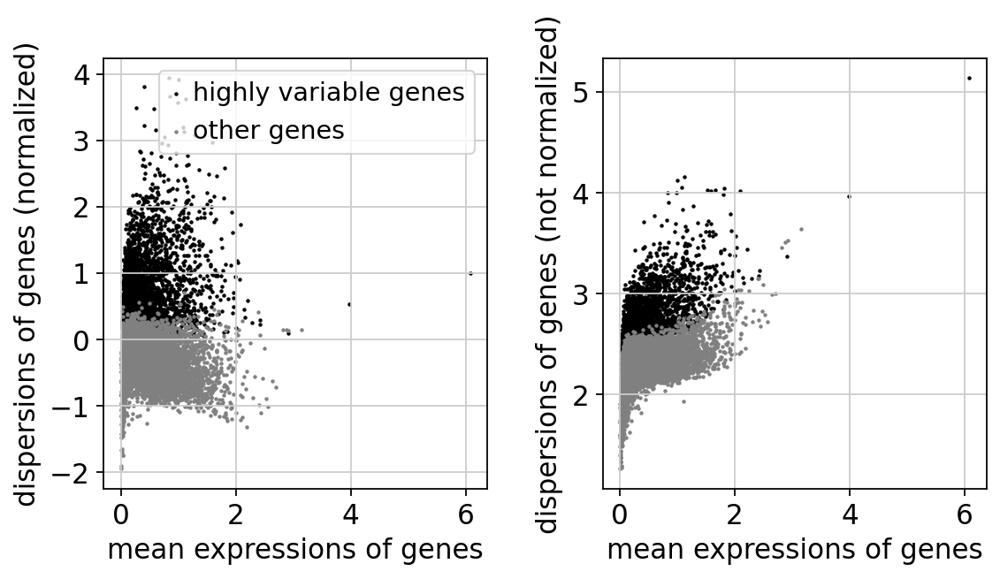

In [17]:
# Identify highly-variable genes.
sc.pp.highly_variable_genes(adata_concat, n_top_genes=5000, batch_key='batch')
sc.pl.highly_variable_genes(adata_concat)

In [ ]:
print("Highly variable genes intersection: %d"%sum(adata_concat.var.highly_variable_intersection))
print("Number of batches where gene is variable:")
print(adata_concat.var.highly_variable_nbatches.value_counts())

var_genes_batch = adata_concat.var.highly_variable_nbatches > 0

Highly variable genes intersection: 57
Number of batches where gene is variable:
4     1794
5     1740
3     1683
2     1522
6     1399
1     1279
0     1126
7     1076
8      902
9      631
10     503
11     410
12     283
13     169
14      57
Name: highly_variable_nbatches, dtype: int64


In [19]:
print("Any batch var genes: %d"%sum(var_genes_batch))
print("All data var genes: %d"%sum(var_genes_all))
print("Overlap: %d"%sum(var_genes_batch & var_genes_all))
print("Variable genes in all batches: %d"%sum(adata_concat.var.highly_variable_nbatches ==3))
print("Overlap batch instersection and all: %d"%sum(var_genes_all & adata_concat.var.highly_variable_intersection))


Any batch var genes: 13448
All data var genes: 5000
Overlap: 4996
Variable genes in all batches: 1683
Overlap batch instersection and all: 57


In [20]:
var_select = adata_concat.var.highly_variable_nbatches > 1
var_genes = var_select.index[var_select]
len(var_genes)

12169

In [21]:
#Filter to highly variable genes
adata_concat = adata_concat[:,var_genes]
adata_concat

View of AnnData object with n_obs × n_vars = 59006 × 12169
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_mt', 'pct_counts_mt', 'platelet', 'RBC', 'batch'
    var: 'mt', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg'

In [22]:
sc.pp.regress_out(adata_concat, keys = ['pct_counts_mt','total_counts'])
adata_concat

regressing out ['pct_counts_mt', 'total_counts']
    sparse input is densified and may lead to high memory use
    finished (0:22:56)


AnnData object with n_obs × n_vars = 59006 × 12169
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_mt', 'pct_counts_mt', 'platelet', 'RBC', 'batch'
    var: 'mt', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg'

In [23]:
sc.pp.scale(adata_concat, max_value=10)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:09)


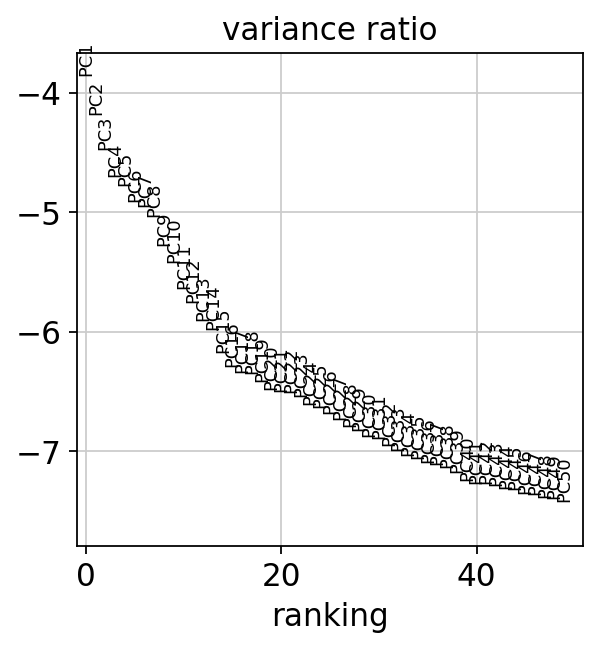

In [ ]:
# Set seed
initialization = 3120
sc.pp.pca(adata_concat, random_state=initialization, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata_concat, n_pcs= 50, log=True, show = True)

In [25]:
adata_concat.obsm['X_pca'].shape

(59006, 50)

In [27]:
normalized_pca = pd.DataFrame(adata_concat.obsm['X_pca'])
meta_data = adata_concat.obs

In [28]:
sc.external.pp.harmony_integrate(adata_concat, 'batch', max_iter_harmony=50)

2024-01-19 15:53:36,068 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-01-19 15:54:34,744 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-01-19 15:54:35,155 - harmonypy - INFO - Iteration 1 of 50
2024-01-19 15:55:11,985 - harmonypy - INFO - Iteration 2 of 50
2024-01-19 15:55:48,284 - harmonypy - INFO - Iteration 3 of 50
2024-01-19 15:56:24,901 - harmonypy - INFO - Iteration 4 of 50
2024-01-19 15:57:01,375 - harmonypy - INFO - Iteration 5 of 50
2024-01-19 15:57:38,198 - harmonypy - INFO - Iteration 6 of 50
2024-01-19 15:58:14,923 - harmonypy - INFO - Converged after 6 iterations


In [30]:
adata_concat.obsm['X_pca'] = adata_concat.obsm['X_pca_harmony']

In [31]:
sc.pp.neighbors(adata_concat, random_state=initialization, n_neighbors=15, n_pcs=30)
#sc.tl.louvain(adata_concat, random_state=initialization, resolution=1.0)
#sc.tl.leiden(adata_concat, random_state=initialization, resolution=0.8) ##previous (for cNMF)
sc.tl.leiden(adata_concat, random_state=initialization, resolution=1.5) 
sc.tl.umap(adata_concat, random_state=initialization)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:34)
running Leiden clustering
    finished: found 36 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:27)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:50)


In [ ]:
ident_new = {'0':'NR1',
             '1':'NR2',
             '2':'NR3',
             '3':'NR4',
             '4':'NR5',
             '5':'NR6',
             '6':'NR7',
             '7':'NR8',
             '8':'R1',
             '9':'R2',
             '10':'R3',
             '11':'R4',
             '12':'R5',
             '13':'R6'
            }


adata_concat.obs['Sample'] = adata_concat.obs['batch'].map(ident_new)

,doublet_score,predicted_doublet,n_genes,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,total_counts_mito,log1p_total_counts_mito,pct_counts_mito,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_mt,pct_counts_mt,platelet,RBC,batch,leiden,Sample
GACCTGCAGCCACATG-1-0,0.286375,False,8868,9947,9.205127,50461.0,10.828976,1334.0,7.196687,2.643626,572.0,6.350886,1.133549,1334.0,2.643626,False,False,0,16,NR1
GCTTACCTCTTGACCC-1-0,0.294673,False,7861,8651,9.065546,37051.0,10.520078,934.0,6.840547,2.520849,280.0,5.638355,0.755715,934.0,2.520849,False,False,0,16,NR1
AGGTATTGTAGTTGGC-1-0,0.256236,False,6301,6686,8.807921,24483.0,10.105775,448.0,6.107023,1.829841,341.0,5.834811,1.392803,448.0,1.829841,False,False,0,0,NR1
CAACTAATCGCTAGTG-1-0,0.341772,False,6768,7406,8.910181,21485.0,9.975157,766.0,6.642487,3.565278,223.0,5.411646,1.037933,766.0,3.565278,False,False,0,13,NR1
GTTACGCCAAATGCCC-1-0,0.341772,False,6196,6817,8.827321,20956.0,9.950228,543.0,6.298949,2.591143,92.0,4.532599,0.439015,543.0,2.591143,False,False,0,13,NR1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CCAGCTAAGCGCTCAA-1-13,0.221229,False,200,208,5.342334,248.0,5.517453,12.0,2.564949,4.838709,8.0,2.197225,3.225806,12.0,4.838709,False,False,13,2,R6
TATGGCCCATCATGTG-1-13,0.073078,False,210,213,5.365976,243.0,5.497168,5.0,1.791759,2.057613,2.0,1.098612,0.823045,5.0,2.057613,False,False,13,5,R6
ACCAATATCCGTAAAC-1-13,0.201369,False,200,209,5.347108,237.0,5.472270,4.0,1.609438,1.687764,15.0,2.772589,6.329114,4.0,1.687764,False,False,13,25,R6
GCCTTGCGTGCTTAGA-1-13,0.052632,False,218,224,5.416100,253.0,5.537334,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,False,False,13,6,R6


In [33]:
adata_concat.obs['predicted_doublet']= adata_concat.obs['predicted_doublet'].astype('str')

In [ ]:
#Final written out adata object:
adata_file = "final_obj_high_resolution.h5ad"
adata_concat.write(adata_file, compression = "gzip")

Copying file://final_obj_without1132_high_resolution.h5ad [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run          
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

| [1 files][  2.6 GiB/  2.6 GiB]  135.2 MiB/s                                   
Operation completed over 1 objects/2.6 GiB.                                      


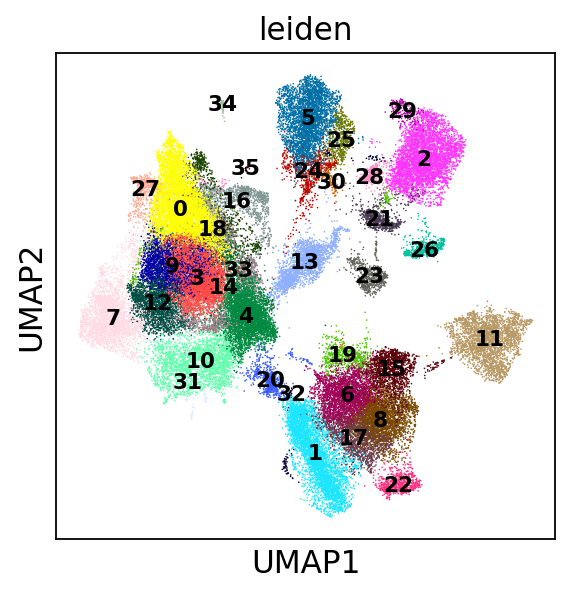

In [ ]:
sc.pl.umap(adata_concat, color=['leiden'],legend_loc = 'on data',legend_fontsize="x-small", show = True)


In [ ]:
leiden_prop = dict()
no_clusters = len(adata_concat.obs['leiden'].unique())
for sn in adata_concat.obs['batch'].unique():
    temp = adata_concat[adata_concat.obs['batch'] == sn,:]
    cell_count = temp.obs['leiden'].value_counts()
    cell_count = cell_count.sort_index()
    cell_count = cell_count.to_dict()
    cell_count = [cell_count[str(x)] if str(x) in cell_count.keys() else 0 for x in range(0,no_clusters)]
    leiden_prop[sn] = cell_count

leiden_prop = pd.DataFrame(leiden_prop).T

leiden_prop['total'] = leiden_prop.sum(axis = 1)
leiden_prct = pd.DataFrame()
for x in leiden_prop.columns:
    leiden_prct[x] = leiden_prop[x]/leiden_prop[x].sum()
leiden_prct = leiden_prct.sort_index()

leiden_prct.T.plot.bar(stacked=True, legend = False,figsize=(7,7))
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol = 3)

In [ ]:
sc.tl.rank_genes_groups(adata_concat, groupby='leiden',values_to_plot='logfoldchanges', min_logfoldchange=3, method='wilcoxon')
sc.pl.rank_genes_groups_dotplot(adata_concat,vmax=7, vmin=-7, n_genes=5)

In [ ]:
sc.pl.rank_genes_groups_heatmap(adata_concat, n_genes=3, values_to_plot='logfoldchanges', min_logfoldchange=3, use_raw=False, swap_axes=True, vmin=-3, vmax=3, cmap='bwr',  figsize=(10,7), show=False);
sc.pl.rank_genes_groups_heatmap(adata_concat, n_genes=3, use_raw=False, swap_axes=True, vmin=-3, vmax=3, cmap='bwr',  figsize=(10,7), show=False);

In [ ]:
pd.DataFrame(adata_concat.uns['wilcoxon']['names']).head(50)

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
0,ELF3,SORBS1,PTPRC,KRT19,S100A6,FMN1,COL6A3,EGFR,COL6A3,MECOM,...,IFNG-AS1,NEBL,PTPRC,SLFN12L,PID1,DDR1,MYH11,MALAT1,MIR31HG,POLQ
1,MECOM,CALD1,FYN,MECOM,KRT19,DOCK4,COL1A2,MIR924HG,COL5A2,COL4A5,...,ST6GAL1,RNF213,PARP8,PTPRC,MAN1A1,PKP3,SORBS1,EZR,MUC4,TTC6
2,CCSER1,PRKG1,SKAP1,DGKH,CCSER1,RAB31,GPC6,DIAPH3,COL1A2,LINC00511,...,GLCCI1,MUC16,CCSER1,ARHGAP15,SLC8A1,FAM83H,SYNPO2,CLIP1,MX2,DIAPH3
3,LINC00511,CARMN,ARHGAP15,LINC00511,MECOM,LRMDA,BICC1,AC078923.1,COL3A1,CCSER1,...,FNDC3A,MACC1,FAM107B,SKAP1,IRAK3,CDH3,CACNB2,KRT19,SMAD3,BMPR1B
4,PPARG,TPM1,PRKCH,CCSER1,PABPC1,SLC8A1,RORA,BRIP1,CALD1,ANK3,...,FBXW7,C15orf48,CNOT6L,SMC4,NFATC2,PLEKHG5,CARMN,ITGA6,RNF213,CPNE4
5,MAST4,LPP,MBNL1,ITGA6,EEF1A1,PLXDC2,COL3A1,MIR205HG,BICC1,KRT19,...,FUT8,NEAT1,FYN,TOX,MRC1,LAD1,LPP,NEAT1,GPRC5A,LINC01572
6,SAMD12,MYH11,CELF2,LMNA,LMNA,ZEB2,BNC2,IGF2BP2,VCAN,RIMS2,...,SEL1L3,MUC4,MAST4,PRKCH,SRGN,IRF6,ACTG2,PPARG,BAIAP2L1,GALNT7
7,LMO7,PALLD,CBLB,COL4A5,KRT17,RBPJ,CALD1,POLQ,PRKG1,DGKH,...,CREB3L2,PARP14,PPARG,FYN,ZBTB16,TNS4,HPSE2,MECOM,XAF1,TBC1D8
8,EZR,ACTA2,ETS1,MAST4,LINC00511,SAT1,COL5A2,CD44,GPC6,AC013652.1,...,FNDC3B,PLAAT4,ARHGAP15,IKZF1,CREB5,SYPL1,DMD,MAST4,APOL1,ASTN2
9,RBM47,RBPMS,ANKRD44,EZR,PTPRM,DMXL2,PRKG1,CDH13,SULF1,SCHLAP1,...,AC008014.1,SCEL,CD55,ENTPD1,ELMO1,HMGA1,PRUNE2,SEMA4A,PPARG,MIR924HG


In [ ]:
# save top 100 differential genes as csv file
all_concat_200 = pd.DataFrame(adata_concat.uns['wilcoxon']['names']).head(200)
all_concat_200.to_csv("all_concat_200genes.csv")

Copying file://all_concat_200genes.csv [Content-Type=text/csv]...
/ [1 files][ 46.2 KiB/ 46.2 KiB]                                                
Operation completed over 1 objects/46.2 KiB.                                     


## 

categories: 0, 1, 2, etc.
var_group_labels: PTPRC, T-cell, T-memory, etc.


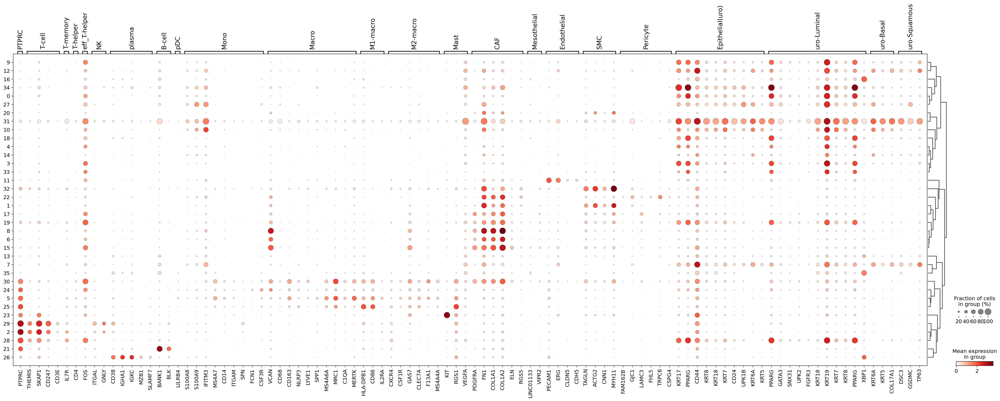

In [ ]:

sc.set_figure_params(dpi=100)

marker_genes_dict = { 'PTPRC':['PTPRC'],
                     'T-cell': ["THEMIS","SKAP1","CD247","CD3E" #'T-cell'
                                ], #CD8T
                     'T-memory':['IL7R'],
                     'T-helper':['CD4'],
                     'eff_T-helper':['FOS'],
                     'NK': ["ITGAL","GNLY"],
                     'plasma': ["CD38","IGHA1",'IGKC','MZB1',"SLAMF7"],
                     'B-cell': ['BANK1','BLK'],  
                     'pDC':['LILRB4'],
                     'Mono':["S100A8","S100A9","IFITM3","MS4A7",'CD14','ITGAM','SPN','FCN1','CSF3R'],   
                     'Macro':["VCAN",'CD68',"CD163",'NLRP3','LYVE1','SPP1',"MS4A6A",'MRC1',"C1QA",'MERTK'],
                     'M1-macro':["HLA-DPB1", "CD86",  "IL2RA"],
                     'M2-macro':['CXCR4','CSF1R','GAS7','CLEC7A','F13A1','MS4A4A'], #'PPARG'
                     
                     'Mast':["KIT",'RGS1','VEGFA'],
                     'CAF':["PDGFRA",'FN1', 'COL1A1', 'COL1A2','ELN','RGS5'],
                     'Mesothelial':[  'LINC01133', 'VIPR2'],
                     'Endothelial':['PECAM1','ERG', 'CLDN5', 'CDH5'],
                     'SMC':['TAGLN', 'ACTG2', 'CNN1', 'MYH11'],
                     'Pericyte':['FAM162B','GJC1','LAMC3','FHL5',  'TRPC6','CSPG4'],
                     'Epithelial(uro)':['KRT17','PPARG','CD44','KRT8','KRT18','KRT7',  
                                        'CD24','UPK1B','KRT6A','KRT5' ],                   
                     
                     'uro-Luminal':["PPARG","GATA3","SNX31","UPK2",'FGFR3', 'KRT18', 'KRT19', 'KRT7', 'KRT8', 'PPARG', 'XBP1'],
                     'uro-Basal': ["KRT6A","KRT5",'COL17A1'],
                     'uro-Squamous':['DSC3','GSDMC',  'TP63'],

         
}

sc.pl.dotplot(adata_concat, marker_genes_dict,"leiden", dendrogram=True)




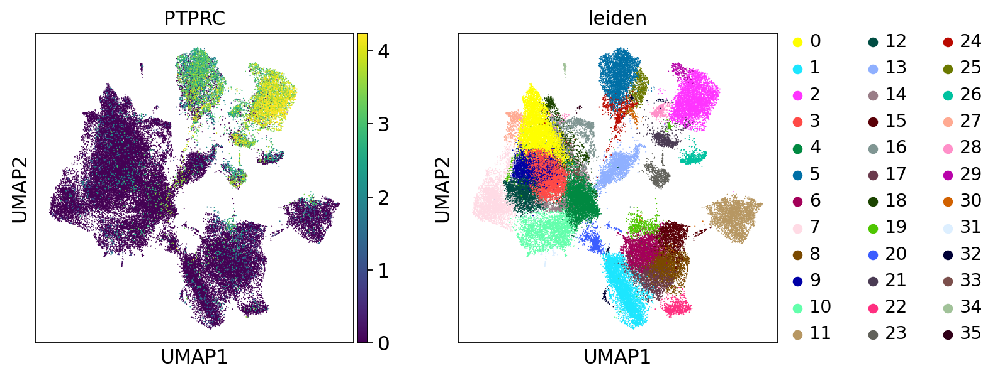

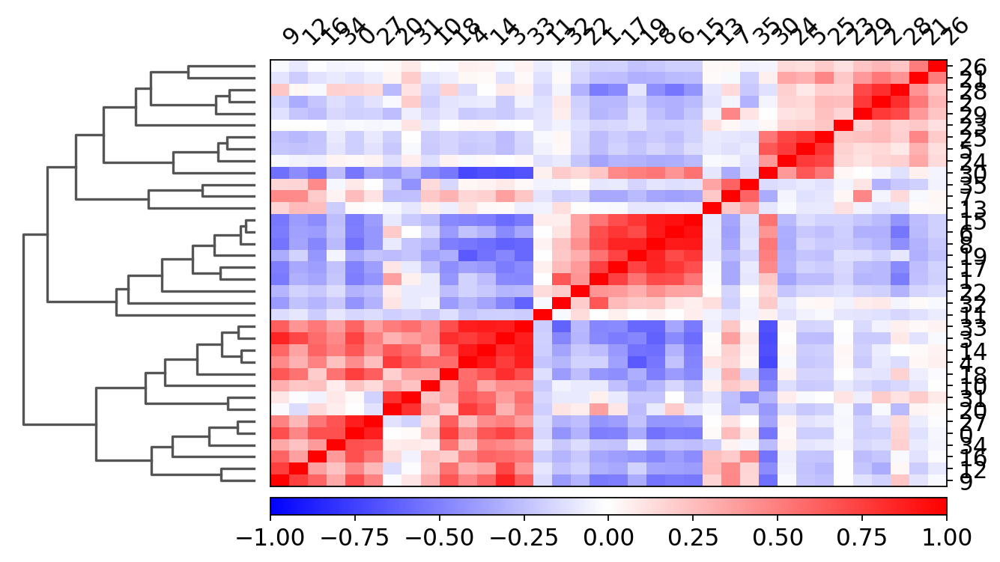

In [ ]:
sc.pl.umap(adata_concat, color = ['PTPRC','leiden'], s=3, frameon=True, ncols=5, vmax='p99')
ax=sc.pl.correlation_matrix(adata_concat,groupby='leiden', figsize=(10,5))

In [ ]:
adata_concat.obs['leiden'][adata_concat.obs['leiden'].isin(['12','31','10'])]='7' #Uro_Basal_Squamous
adata_concat.obs['leiden'][adata_concat.obs['leiden'].isin(['13','35','9','16','34','27','18','4','14','3','33'])]='0' #Uro_Luminal
adata_concat.obs['leiden'][adata_concat.obs['leiden'].isin(['20','32'])]='1' #SMC
adata_concat.obs['leiden'][adata_concat.obs['leiden'].isin(['17','19','8','15'])]='6' #CAF
adata_concat.obs['leiden'][adata_concat.obs['leiden'].isin(['30','25'])]='5' #Macro
#set(adata_concat.obs.leiden)
adata_concat.obs['cell_type'] = adata_concat.obs['leiden'].astype('string')

{'0', '1', '11', '2', '21', '22', '23', '24', '26', '28', '29', '5', '6', '7'}

In [ ]:
adata_concat.obs.loc[adata_concat.obs.cell_type == "0", "cell_type"] = "uro-Luminal"
adata_concat.obs.loc[adata_concat.obs.cell_type == "1", "cell_type"] = "stromal-SMC"
adata_concat.obs.loc[adata_concat.obs.cell_type == "11", "cell_type"] = "stromal-Endothelial"
adata_concat.obs.loc[adata_concat.obs.cell_type == "2", "cell_type"] = "immune-T"
adata_concat.obs.loc[adata_concat.obs.cell_type == "21", "cell_type"] = "immune-B"
adata_concat.obs.loc[adata_concat.obs.cell_type == "22", "cell_type"] = "stromal-Pericyte"
adata_concat.obs.loc[adata_concat.obs.cell_type == "23", "cell_type"] = "immune-Mast"
adata_concat.obs.loc[adata_concat.obs.cell_type == "24", "cell_type"] = "immune-Mono"
adata_concat.obs.loc[adata_concat.obs.cell_type == "26", "cell_type"] = "immune-Plasma"
adata_concat.obs.loc[adata_concat.obs.cell_type == "28", "cell_type"] = "immune-Tmemory"
adata_concat.obs.loc[adata_concat.obs.cell_type == "29", "cell_type"] = "immune-NK"
adata_concat.obs.loc[adata_concat.obs.cell_type == "5", "cell_type"] = "immune-Macro"
adata_concat.obs.loc[adata_concat.obs.cell_type == "6", "cell_type"] = "stromal-CAF"
adata_concat.obs.loc[adata_concat.obs.cell_type == "7", "cell_type"] = "uro-Basal_Squamous"





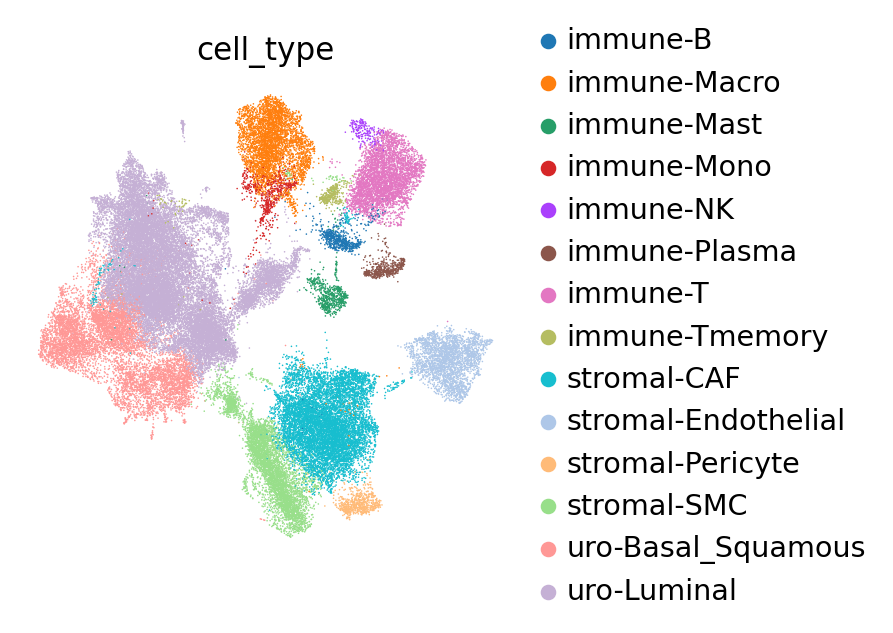

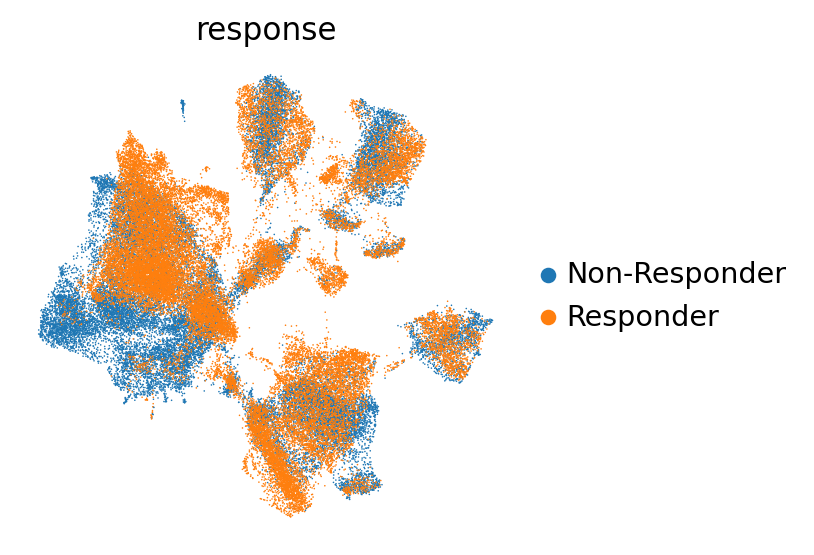

In [ ]:
adata_concat.obs['cell_type'] = adata_concat.obs['cell_type'].astype('category')
adata_concat.obs["cell_type"].cat.categories
sc.pl.umap(adata_concat, color=[ "cell_type"], frameon=False)
sc.pl.umap(adata_concat, color=["response"], frameon=False)

In [ ]:
sc.pl.umap(adata_concat, color=['cell_type'],  palette={
    "immune-B":"#d7301f",
    "immune-Macro":"#d7301f",
    "immune-Mast":"#d7301f",
    "immune-Mono":"#d7301f",
    "immune-NK":"#d7301f",
    "immune-Plasma":"#d7301f",
    "immune-T":"#d7301f",
    "immune-Tmemory":"#d7301f",
    "stromal-CAF":"#2b8cbe",
     "stromal-Endothelial":"#2b8cbe",
     "stromal-Pericyte":"#2b8cbe",
    "stromal-SMC":"#2b8cbe",
     "uro-Basal_Squamous":"#88C38B",
    "uro-Luminal":"#88C38B"
                                                    },show = True,frameon=False,save='harmonized_object2')


Copying file://figures/umapharmonized_object2.jpg [Content-Type=image/jpeg]...
/ [1 files][ 62.2 KiB/ 62.2 KiB]                                                
Operation completed over 1 objects/62.2 KiB.                                     


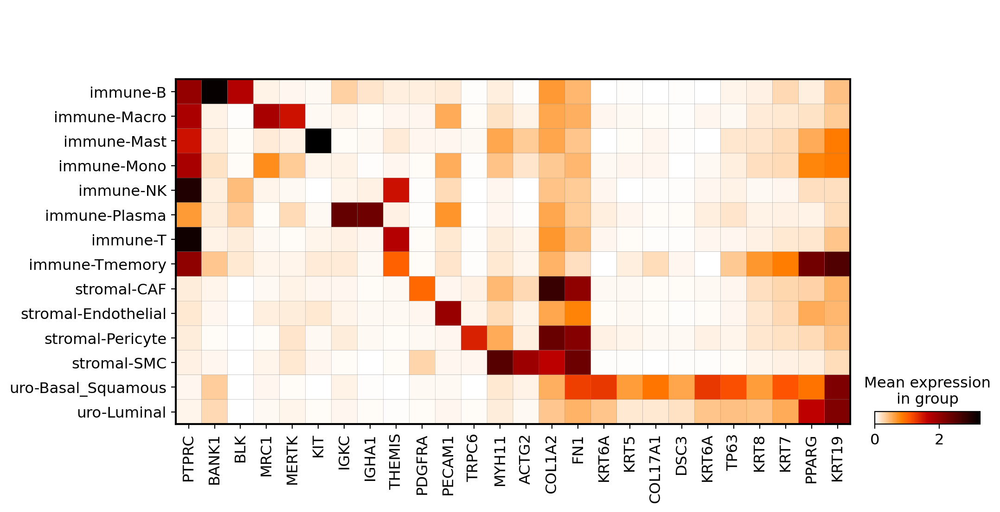

In [ ]:
ax3_dict = sc.pl.matrixplot(adata_concat, ['PTPRC',
                            "BANK1","BLK",'MRC1',"MERTK",'KIT',#'GNLY',
                            "IGKC","IGHA1", 
                            "THEMIS","PDGFRA", 
                            
                            
                            'PECAM1',"TRPC6",'MYH11',"ACTG2",'COL1A2',"FN1",
    "KRT6A","KRT5",'COL17A1','DSC3',
    'KRT6A', 'TP63', #Basal-squam
                        'KRT8',"KRT7",
    "PPARG", "KRT19",],
                            groupby='cell_type', show=False, cmap='gist_heat_r')

In [ ]:
#Final written out adata object:
adata_file = "final_obj_high_resolution_annotated.h5ad"
adata_concat.write(adata_file, compression = "gzip")
!gsutil cp final_obj_high_resolution_annotated.h5ad $bucket/cellranger_output_directory/bladder/harmony/

Copying file://final_obj_without1132_high_resolution_annotated.h5ad [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run          
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/ [1 files][  2.6 GiB/  2.6 GiB]  131.1 MiB/s                                   
Operation completed over 1 objects/2.6 GiB.                                      
